<center><img src="https://nodusanalytics.com/wp-content/uploads/2021/03/bi-dashboard-for-website.gif" width="600" align="center"/></center>

<center>Reference:<a href="https://nodusanalytics.com/wp-content/uploads/2021/03/bi-dashboard-for-website.gif"> image source</a></center>

<div class="alert alert-block alert-info">  
<h2><center><strong>Importing Python Libraries 📘 📙|</strong></center></h2>
        
</div>

In [1]:
import re
import nltk
import numpy as np
import seaborn as sns
import pandas as pd
from array import *
import string
from wordcloud import WordCloud
from nltk.corpus import stopwords
import matplotlib.cm as cm
from collections import Counter
from matplotlib import rcParams
import matplotlib.pyplot as plt
from prettytable import PrettyTable
from nltk.corpus import stopwords
from nltk.tokenize import RegexpTokenizer
from sklearn.ensemble import VotingClassifier
from nltk.tokenize import sent_tokenize, word_tokenize 
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics import f1_score
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import LinearSVC
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn import preprocessing
from sklearn.feature_selection import VarianceThreshold
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2
from sklearn.feature_selection import f_classif
from sklearn.feature_selection import mutual_info_classif
from sklearn.feature_selection import SelectFromModel
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import roc_curve, auc
from mlxtend.plotting import plot_confusion_matrix 
from sklearn.metrics import classification_report, confusion_matrix
import plotly.express as px

import warnings
warnings.filterwarnings("ignore")

<div class="alert alert-block alert-info">  
<h2><center><strong>Loading training the data 📁 📂</strong></center></h2>
        
</div>

In [2]:
df = pd.read_excel("DAC Daily All Call Report.xlsx") 

<div class="alert alert-block alert-info">  
<h1><center><strong>Exploratory data analysis 🔎</strong></center></h1>
        
</div>

### 5 top records of data

In [3]:
df.head(5)

,Call Id,Agent ID,Product,Call Start Date,Call End Date,Call Duration,Can Be Reached,Source TN,Accout No,Web Error Code,...,Self Service,Transferred To,Action Taken,Callback Preference,Callback Name,Local Time Zone,Specifics of Email,Email Address in Body of Email,Ask Customer To Send Email,Created Date
0,CT1411048215,ED064K,U-VERSE,12/1/2022 3:44:39 AM,12/1/2022 5:49:44 AM,02:05:05,NOT APPLICABLE (OTHER),SPCL_2_2859_DACATT,115602843,NaN,...,YES,NaN,1. Name/Relationship to Account Holder: angela...,NaN,angela miller,NaN,NaN,NaN,NaN,12/1/2022 5:49:43 AM
1,CT1411048216,MB315H,U-VERSE,12/1/2022 4:13:17 AM,12/1/2022 5:35:44 AM,01:22:27,VALIDATED CBR,MOBILITY_NEW,323169927,no err code,...,YES,NaN,1. Name/Relationship to Account Holder AH 2. ...,NaN,Jaret Reet,NaN,NaN,NaN,NaN,12/1/2022 5:35:43 AM
2,CT1411048217,AG8149,NO AT&T SERVICE,12/1/2022 4:15:34 AM,12/1/2022 4:33:19 AM,00:17:45,NOT APPLICABLE (AT&T WIRELESS),DCARE_0116,,NaN,...,NO,NaN,1. Name/Relationship to Account Holder: Tim Ri...,NaN,Tim Riche,NaN,NaN,NaN,NaN,12/1/2022 4:33:18 AM
3,CT1411048219,CC320Y,NO AT&T SERVICE,12/1/2022 4:40:34 AM,12/1/2022 4:45:11 AM,00:04:37,NOT APPLICABLE (OTHER),SMARTCHAT,73071,NaN,...,YES,NaN,1. Chatter: Tammy /#mobility_technical_suppor...,NaN,Marty Welch,NaN,NaN,NaN,NaN,12/1/2022 4:45:11 AM
4,CT1411048221,CC7338,NO AT&T SERVICE,12/1/2022 5:03:23 AM,12/1/2022 5:43:22 AM,00:39:59,NOT APPLICABLE (OTHER),FRAUD_LOCKED_0144,46112,NaN,...,YES,NaN,1. Name/Relationship to Account Holder: Karti...,NaN,Kartik Patel,NaN,NaN,NaN,NaN,12/1/2022 5:43:22 AM


### 5 last records of data

In [4]:
df.tail(5)

,Call Id,Agent ID,Product,Call Start Date,Call End Date,Call Duration,Can Be Reached,Source TN,Accout No,Web Error Code,...,Self Service,Transferred To,Action Taken,Callback Preference,Callback Name,Local Time Zone,Specifics of Email,Email Address in Body of Email,Ask Customer To Send Email,Created Date
47710,CT1411144716,RS228D,NO AT&T SERVICE,1/4/2023 3:50:18 PM,1/4/2023 3:57:03 PM,00:06:45,NOT APPLICABLE (OTHER),MOBILITY_NEW,,NaN,...,NO,NaN,Name/relationship to account holder: unknown C...,NaN,unknown unknown,NaN,NaN,NaN,NaN,1/4/2023 3:57:03 PM
47711,CT1411144724,HP005X,NO AT&T SERVICE,1/4/2023 3:53:46 PM,1/4/2023 3:59:54 PM,00:06:08,NOT APPLICABLE (OTHER),UVCARE_0113,11111111111,NaN,...,YES,NaN,1. Name/Relationship to Account Holder: ROBERT...,NaN,ROBERT ODONNELL,NaN,NaN,NaN,NaN,1/4/2023 3:59:53 PM
47712,CT1411144729,KM752P,WIRELESS,1/4/2023 3:56:02 PM,1/4/2023 3:56:39 PM,00:00:37,NOT APPLICABLE (OTHER),SMARTCHAT,578101621518,NaN,...,NO,NaN,1. Chatter: Patrick / PH2188 / agent_mob_loyal...,NaN,Willam Curtis,NaN,NaN,NaN,NaN,1/4/2023 3:56:38 PM
47713,CT1411144730,RT8993,UNKNOWN,1/4/2023 3:56:21 PM,1/4/2023 3:57:35 PM,00:01:14,NOT APPLICABLE (OTHER),WEBERR_5553_ATT_DAC,,see notes,...,NO,NaN,Name/Relationship to Account Holder Dead air ...,NaN,unknown unknown,NaN,NaN,NaN,NaN,1/4/2023 3:57:35 PM
47714,CT1411144732,CM4020,WIRELESS,1/4/2023 3:56:26 PM,1/4/2023 3:59:16 PM,00:02:50,NOT APPLICABLE (AT&T WIRELESS),MOBILITY_NEW,963399895,NaN,...,NO,NaN,1. Name/Relationship to Account Holder ruben c...,NaN,ruben chavira,NaN,NaN,NaN,NaN,1/4/2023 3:59:15 PM


### Coloumns/features in data

In [5]:
df.columns

Index(['Call Id', 'Agent ID', 'Product', 'Call Start Date', 'Call End Date',
       'Call Duration', 'Can Be Reached', 'Source TN', 'Accout No',
       'Web Error Code', 'Customer Name', 'Contact TN', 'Contact Reason',
       'Contact Reason Detail', 'Contact Resolution', 'Issue Reason Addl Info',
       'Err Msg Desc', 'Rep Location', 'Caller Authenticated',
       'Method of Auth', 'Biller', 'Type of Device Used',
       'MyATT APP Offered/Used', 'Self Service', 'Transferred To',
       'Action Taken', 'Callback Preference', 'Callback Name',
       'Local Time Zone', 'Specifics of Email',
       'Email Address in Body of Email', 'Ask Customer To Send Email',
       'Created Date'],
      dtype='object')

### Length of data

In [6]:
print('lenght of data is', len(df))

lenght of data is 47715


### Shape of data

In [7]:
df.shape

(47715, 33)

### Data information

In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 47715 entries, 0 to 47714
Data columns (total 33 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   Call Id                         47539 non-null  object 
 1   Agent ID                        47539 non-null  object 
 2   Product                         47539 non-null  object 
 3   Call Start Date                 47539 non-null  object 
 4   Call End Date                   47539 non-null  object 
 5   Call Duration                   47539 non-null  object 
 6   Can Be Reached                  46837 non-null  object 
 7   Source TN                       46837 non-null  object 
 8   Accout No                       47715 non-null  object 
 9   Web Error Code                  4119 non-null   object 
 10  Customer Name                   46837 non-null  object 
 11  Contact TN                      46837 non-null  float64
 12  Contact Reason                  

### Data types of all coloumns

In [9]:
df.dtypes

Call Id                            object
Agent ID                           object
Product                            object
Call Start Date                    object
Call End Date                      object
Call Duration                      object
Can Be Reached                     object
Source TN                          object
Accout No                          object
Web Error Code                     object
Customer Name                      object
Contact TN                        float64
Contact Reason                     object
Contact Reason Detail              object
Contact Resolution                 object
Issue Reason Addl Info            float64
Err Msg Desc                       object
Rep Location                       object
Caller Authenticated               object
Method of Auth                     object
Biller                             object
Type of Device Used                object
MyATT APP Offered/Used             object
Self Service                      

### Checking Null values

In [10]:
np.sum(df.isnull().any(axis=1))

47715

### Rows and columns in the dataset

In [11]:
print('Count of columns in the data is:  ', len(df.columns))

Count of columns in the data is:   33


In [12]:
print('Count of rows in the data is:  ', len(df))

Count of rows in the data is:   47715


### Checking duplicate data

In [13]:
current=len(df)
print('Rows of data before Delecting ', current)

Rows of data before Delecting  47715


In [14]:
df=df.drop_duplicates()

In [15]:
now=len(df)
print('Rows of data before Delecting ', now)

Rows of data before Delecting  47715


In [16]:
diff=current-now
print('Duplicated rows are ', diff)

Duplicated rows are  0


### Checking Null values

In [17]:
df.isnull().sum()

Call Id                             176
Agent ID                            176
Product                             176
Call Start Date                     176
Call End Date                       176
Call Duration                       176
Can Be Reached                      878
Source TN                           878
Accout No                             0
Web Error Code                    43596
Customer Name                       878
Contact TN                          878
Contact Reason                      176
Contact Reason Detail               176
Contact Resolution                  176
Issue Reason Addl Info            47715
Err Msg Desc                      46419
Rep Location                      19865
Caller Authenticated                875
Method of Auth                    22764
Biller                            22845
Type of Device Used                 875
MyATT APP Offered/Used              173
Self Service                        875
Transferred To                    46871


# Filling the missing values as NaN for now

In [18]:
df=df.fillna('NaN')

### Removing the fatures with low Variance 

In [19]:
def get_low_var_cols(df, thres=70):
    low_var_cols = []
    for col in df.columns:
        percent_count = df[col].value_counts()/len(df)*100
        if percent_count.max() > thres:
            low_var_cols.append(col)
    return low_var_cols

In [20]:
# Identify columns that has same data across 70% of the rows
variance_thres = 70
low_var_cols = get_low_var_cols(df, variance_thres)
print('{} \n\n are columns with same data across 70% of the rows'.format(
    str(low_var_cols)[1:-1]))

'Web Error Code', 'Contact Resolution', 'Issue Reason Addl Info', 'Err Msg Desc', 'Transferred To', 'Callback Preference', 'Local Time Zone', 'Specifics of Email', 'Email Address in Body of Email', 'Ask Customer To Send Email' 

 are columns with same data across 70% of the rows


In [21]:
# Drop the low variance columns
drop_cols = low_var_cols
df = df.drop(drop_cols, axis=1)

### Replacing the NaN values to numpy nan as missing 

In [22]:
df=df.replace('NaN',np.NaN)

## Checking the missing values 

In [23]:
df.isnull().sum()

Call Id                     176
Agent ID                    176
Product                     176
Call Start Date             176
Call End Date               176
Call Duration               176
Can Be Reached              878
Source TN                   878
Accout No                     0
Customer Name               878
Contact TN                  878
Contact Reason              176
Contact Reason Detail       176
Rep Location              19865
Caller Authenticated        875
Method of Auth            22764
Biller                    22845
Type of Device Used         875
MyATT APP Offered/Used      173
Self Service                875
Action Taken                175
Callback Name               875
Created Date                  0
dtype: int64

## As these variables have a lot of missing valeus so dont need them

In [24]:
df=df.drop(columns=['Rep Location','Method of Auth', 'Biller'])

## Checking the missing values again

In [25]:
df.isnull().sum()

Call Id                   176
Agent ID                  176
Product                   176
Call Start Date           176
Call End Date             176
Call Duration             176
Can Be Reached            878
Source TN                 878
Accout No                   0
Customer Name             878
Contact TN                878
Contact Reason            176
Contact Reason Detail     176
Caller Authenticated      875
Type of Device Used       875
MyATT APP Offered/Used    173
Self Service              875
Action Taken              175
Callback Name             875
Created Date                0
dtype: int64

## as we dont have much missing values now in the data so going to drop all the rows where NaN values 

In [26]:
df=df.dropna()

In [27]:
df.isnull().sum()

Call Id                   0
Agent ID                  0
Product                   0
Call Start Date           0
Call End Date             0
Call Duration             0
Can Be Reached            0
Source TN                 0
Accout No                 0
Customer Name             0
Contact TN                0
Contact Reason            0
Contact Reason Detail     0
Caller Authenticated      0
Type of Device Used       0
MyATT APP Offered/Used    0
Self Service              0
Action Taken              0
Callback Name             0
Created Date              0
dtype: int64

> So now we can see that there is no any missing values so we are good to go!

# Wordcloud of Action Taken

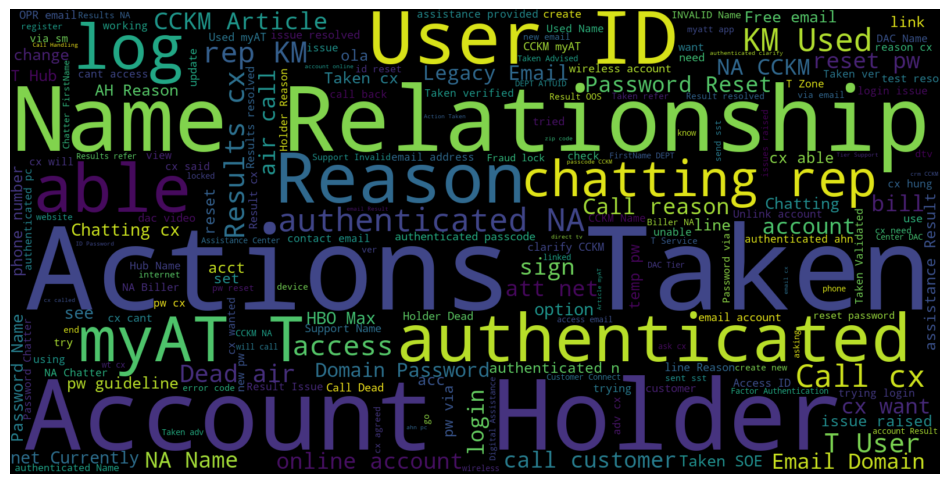

In [28]:
neg = df['Action Taken']
neg_string = []
for t in neg:
    neg_string.append(t)
neg_string = pd.Series(neg_string).str.cat(sep=' ')
wordcloud = WordCloud(width=1600, height=800,max_font_size=200).generate(neg_string)
plt.figure(figsize=(12,10))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.show()

<div class="alert alert-block alert-info">  
<h1><center><strong>Preprocessing the Action Taken 💡</strong></center></h1>

   
        
</div>

In [29]:
for letter in '1234567890.(/':
    df["Action Taken"] = df["Action Taken"].str.replace(letter,'')

#### Preprocess df on Descripcion

In [30]:
english_punctuations = string.punctuation
punctuations_list = english_punctuations + english_punctuations

def remove_punctuations(text):
    translator = str.maketrans('', '', punctuations_list)
    return text.translate(translator)

#### Remove_repeating_char

In [31]:
def remove_repeating_char(text):
    return re.sub(r'(.)\1+', r'\1', text)

#### ProcessPost for applying all functions

In [32]:
def processPost(text): 

    text = re.sub('@[^\s]+', ' ', text)
    

    text = re.sub('((www\.[^\s]+)|(https?://[^\s]+))',' ',text)

    text = re.sub(r'####([^\s]+)', r'\1', text)

    text= remove_punctuations(text)
    text=remove_repeating_char(text)
    
    return text

#### Applying processPost function for preprocessing

In [33]:
df["Action Taken"]=df["Action Taken"].astype(str)
df["Action Taken"] = df["Action Taken"].apply(lambda x: processPost(x))

#### Getting Tokenization

In [34]:
tokenizer = RegexpTokenizer(r'\w+')
df["Action Taken"] = df["Action Taken"].apply(tokenizer.tokenize)

In [35]:
df["Action Taken"].head()

0    [NameRelationship, to, Acount, Holder, angela,...
1    [NameRelationship, to, Acount, Holder, AH, Rea...
2    [NameRelationship, to, Acount, Holder, Tim, Ri...
3    [Chater, Tamy, mobilitytechnicalsuportagentint...
4    [NameRelationship, to, Acount, Holder, Kartik,...
Name: Action Taken, dtype: object

#### Stop words of english

In [36]:
stopwords_list = stopwords.words('english')

In [37]:
len(stopwords_list)

179

In [38]:
df["Action Taken"]=df["Action Taken"].apply(lambda x: [item for item in x if item not in stopwords_list])

In [39]:
df["Action Taken"].head()

0    [NameRelationship, Acount, Holder, angela, mil...
1    [NameRelationship, Acount, Holder, AH, Reason,...
2    [NameRelationship, Acount, Holder, Tim, Riche,...
3    [Chater, Tamy, mobilitytechnicalsuportagentint...
4    [NameRelationship, Acount, Holder, Kartik, Pat...
Name: Action Taken, dtype: object

####  Text information

In [40]:
all_words = [word for tokens in df["Action Taken"] for word in tokens]
sentence_lengths = [len(tokens) for tokens in df["Action Taken"]]

VOCAB = sorted(list(set(all_words)))

print("%s words total, with a vocabulary size of %s" % (len(all_words), len(VOCAB)))
print("Max sentence length is %s" % max(sentence_lengths))

2216994 words total, with a vocabulary size of 51565
Max sentence length is 267


#### Top 25 words in  text

In [42]:
counter = Counter(all_words)

In [43]:
counter.most_common(25)

[('cx', 77657),
 ('Al', 44683),
 ('How', 43896),
 ('Reason', 42521),
 ('authenticated', 42067),
 ('acount', 40028),
 ('Actions', 38398),
 ('Taken', 38231),
 ('Cal', 31907),
 ('email', 31206),
 ('Results', 30920),
 ('Acount', 25203),
 ('NameRelationship', 25135),
 ('Holder', 24651),
 ('pw', 22497),
 ('aces', 20266),
 ('able', 20101),
 ('log', 18301),
 ('CKM', 17589),
 ('rep', 17303),
 ('ID', 16038),
 ('cal', 15746),
 ('reset', 14602),
 ('login', 13666),
 ('myAT', 13161)]

In [44]:
counted_words = Counter(all_words)

words = []
counts = []
for letter, count in counted_words.most_common(25):
    words.append(letter)
    counts.append(count)

<BarContainer object of 25 artists>

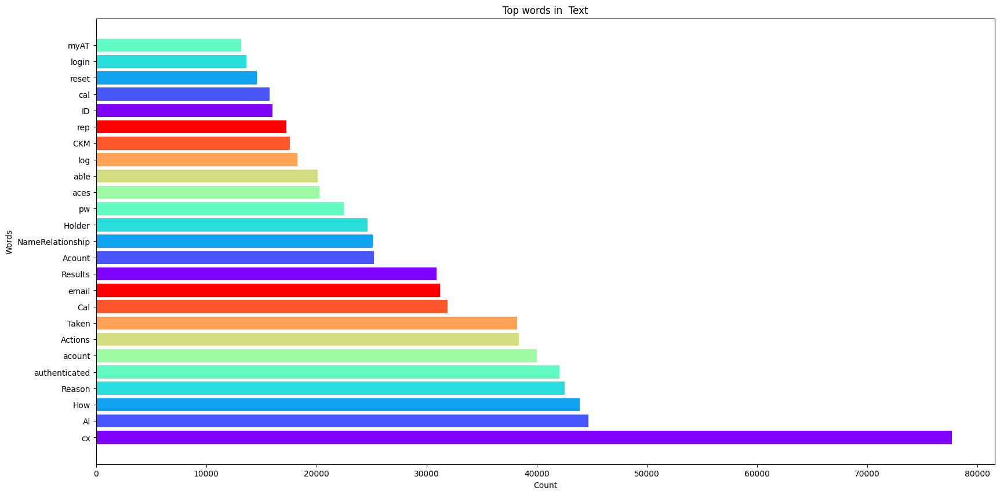

In [45]:
colors = cm.rainbow(np.linspace(0, 1, 10))
rcParams['figure.figsize'] = 20, 10
plt.title('Top words in  Text')
plt.xlabel('Count')
plt.ylabel('Words')
plt.barh(words, counts, color=colors)

> These are the words which are used most of the time in action taken against the calls. 

## Looking at the Call ID 

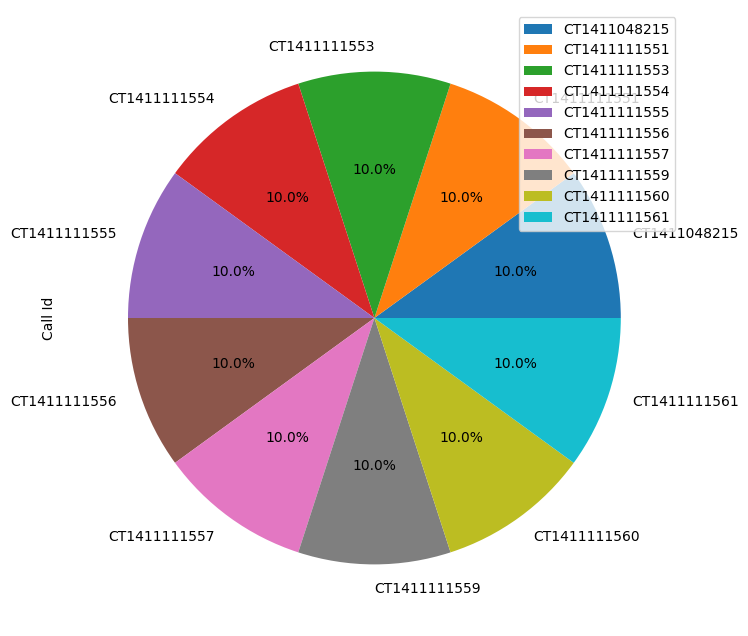

In [46]:
df["Call Id"].value_counts().head(10).plot(kind = 'pie', autopct='%1.1f%%', figsize=(8, 8)).legend()

In [47]:
df["Call Id"].value_counts()

CT1411048215    1
CT1411111551    1
CT1411111553    1
CT1411111554    1
CT1411111555    1
               ..
CT1411078380    1
CT1411078383    1
CT1411078384    1
CT1411078385    1
CT1411144732    1
Name: Call Id, Length: 46837, dtype: int64

> All the caller ID's are different. There is no any repeat caller in this data so it means that the quaries solveed successfully! 

## Lookinmg at the Agent ID 

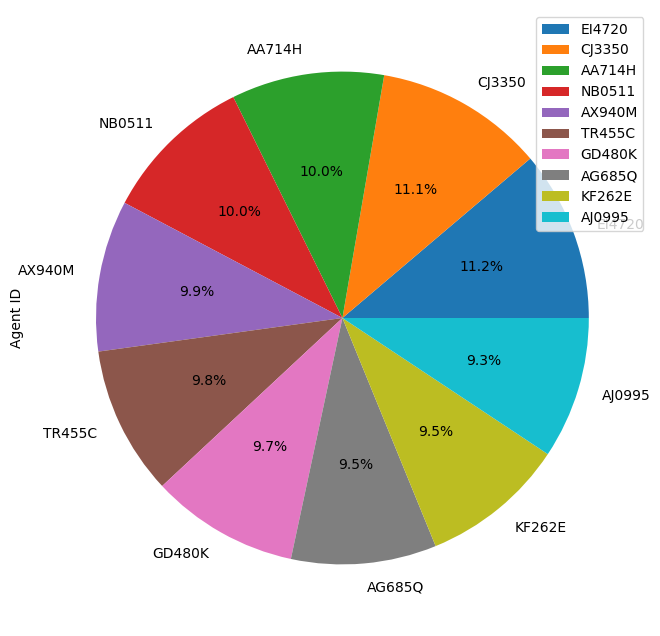

In [48]:
df["Agent ID"].value_counts().head(10).plot(kind = 'pie', autopct='%1.1f%%', figsize=(8, 8)).legend()

In [49]:
df["Agent ID"].value_counts()

EI4720    576
CJ3350    570
AA714H    515
NB0511    512
AX940M    510
         ... 
rb937t      1
YT188F      1
cc454e      1
cj3350      1
ml636s      1
Name: Agent ID, Length: 275, dtype: int64

> There are many agents who attedn the call of Callers and EI4720 agent took most of the calls. 

## Looking at the Product

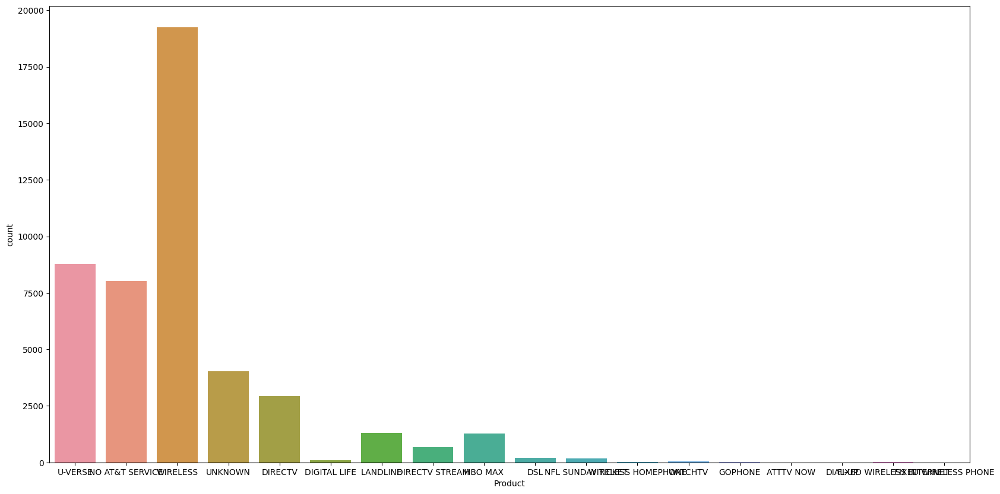

In [50]:
sns.countplot(data= df, x = "Product")
plt.show()

In [51]:
fig = px.pie(df, names = 'Product',color_discrete_sequence=px.colors.sequential.Inferno, 
             title = 'Product')
fig.show()

In [52]:
df["Product"].value_counts()

WIRELESS                   19239
U-VERSE                     8792
NO AT&T SERVICE             8029
UNKNOWN                     4021
DIRECTV                     2918
LANDLINE                    1293
HBO MAX                     1282
DIRECTV STREAM               676
DSL                          212
NFL SUNDAY TICKET            167
DIGITAL LIFE                 101
WATCHTV                       52
GOPHONE                       21
WIRELESS HOMEPHONE            16
FIXED WIRELESS INTERNET        7
ATTTV NOW                      5
DIAL-UP                        3
FIXED WIRELESS PHONE           3
Name: Product, dtype: int64

> Most ofthe time, wireless products discussed wiht the count of 19239 and on the seconf number U-Verse.

## Looking at the Can be reached feature

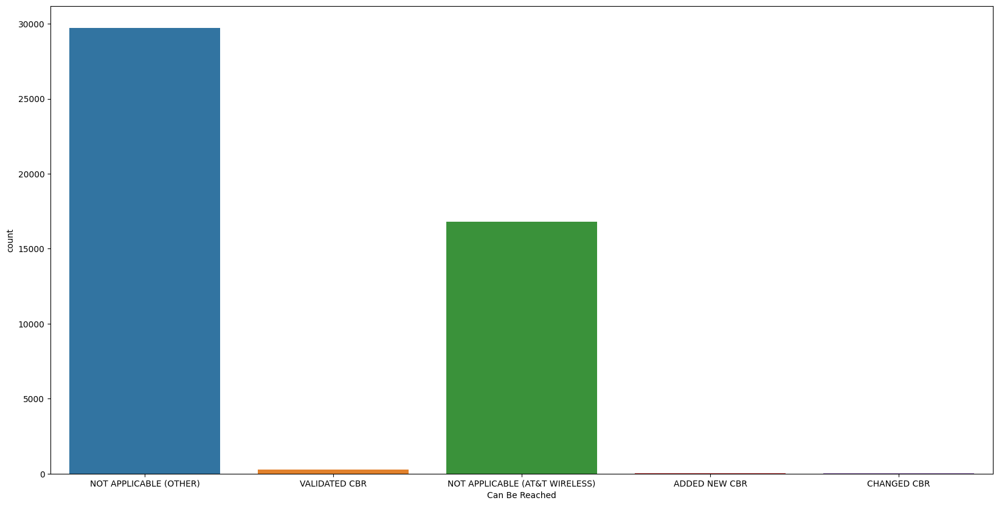

In [53]:
sns.countplot(data= df, x = "Can Be Reached")
plt.show()

In [54]:
fig = px.pie(df, names = 'Can Be Reached', 
             title = 'Can Be Reached')
fig.show()

In [55]:
df["Can Be Reached"].value_counts()

NOT APPLICABLE (OTHER)            29709
NOT APPLICABLE (AT&T WIRELESS)    16802
VALIDATED CBR                       282
CHANGED CBR                          25
ADDED NEW CBR                        19
Name: Can Be Reached, dtype: int64

> Not applicable are repeated most of the time from each caller ID. 

## Looking at the Source TN

<AxesSubplot: xlabel='count', ylabel='Source TN'>

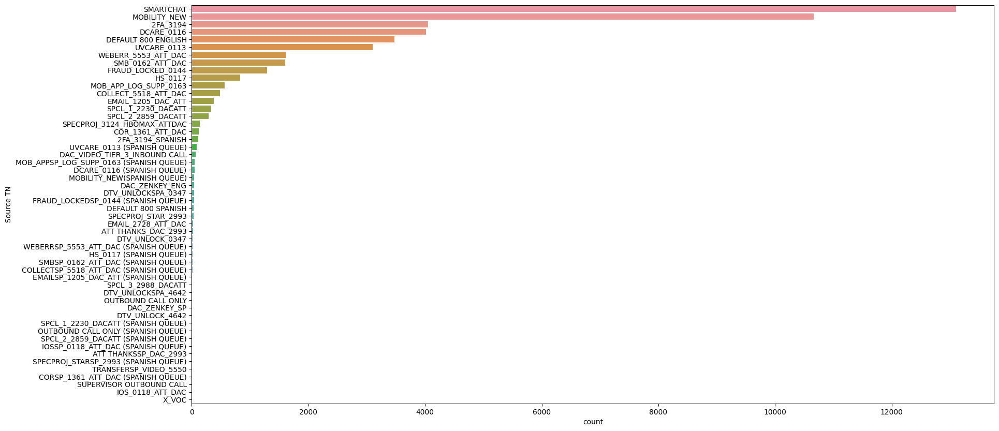

In [56]:
sns.countplot(y = "Source TN", data = df,order = df["Source TN"].value_counts().index)

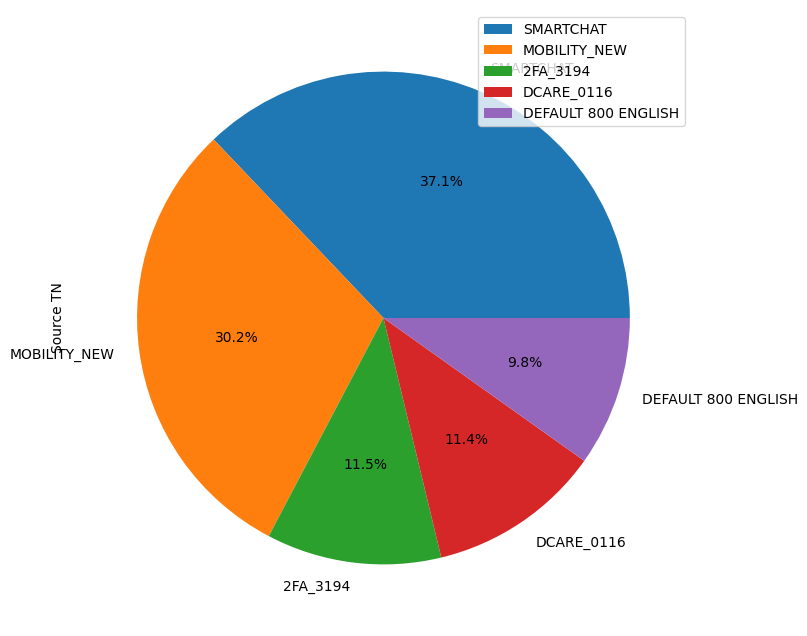

In [57]:
df["Source TN"].value_counts().head(5).plot(kind = 'pie', autopct='%1.1f%%', figsize=(8, 8)).legend()

In [58]:
df["Source TN"].value_counts()

SMARTCHAT                                  13099
MOBILITY_NEW                               10661
2FA_3194                                    4051
DCARE_0116                                  4020
DEFAULT 800 ENGLISH                         3475
UVCARE_0113                                 3098
WEBERR_5553_ATT_DAC                         1611
SMB_0162_ATT_DAC                            1606
FRAUD_LOCKED_0144                           1292
HS_0117                                      832
MOB_APP_LOG_SUPP_0163                        561
COLLECT_5518_ATT_DAC                         482
EMAIL_1205_DAC_ATT                           380
SPCL_1_2230_DACATT                           336
SPCL_2_2859_DACATT                           290
SPECPROJ_3124_HBOMAX_ATTDAC                  140
COR_1361_ATT_DAC                             125
2FA_3194_SPANISH                             111
UVCARE_0113 (SPANISH QUEUE)                   87
DAC_VIDEO_TIER_3_INBOUND CALL                 68
MOB_APPSP_LOG_SUPP_0

> Smart chat and mobility new are the TN sources which repeated and discussed in the calls. 

## Looking at the Self Sevices

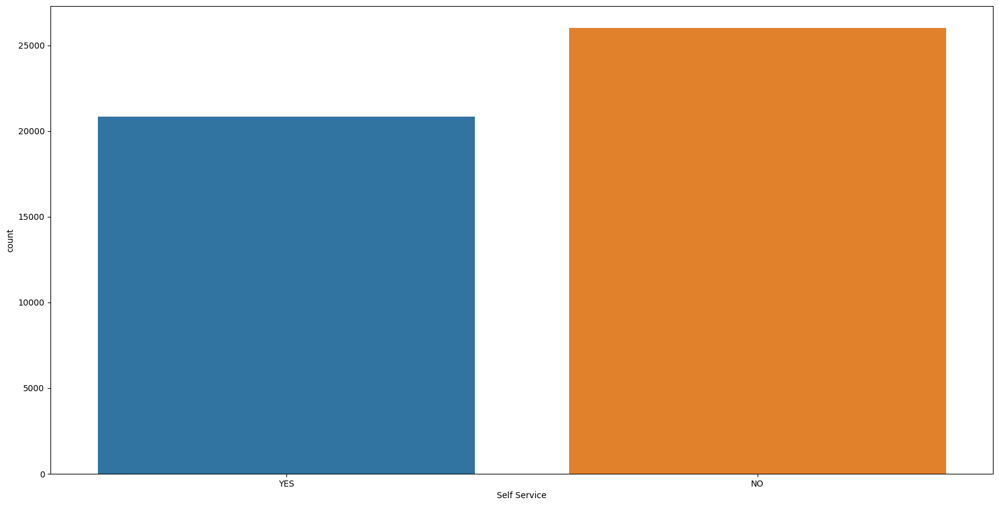

In [59]:
sns.countplot(data= df, x = "Self Service")
plt.show()

In [60]:
fig = px.pie(df, names = 'Self Service',color_discrete_sequence=px.colors.sequential.Inferno, 
             title = 'Self Service')
fig.show()

> Self services was not provided most of the time but 44.5% times provided as well.

## Looking at the Contact Reason

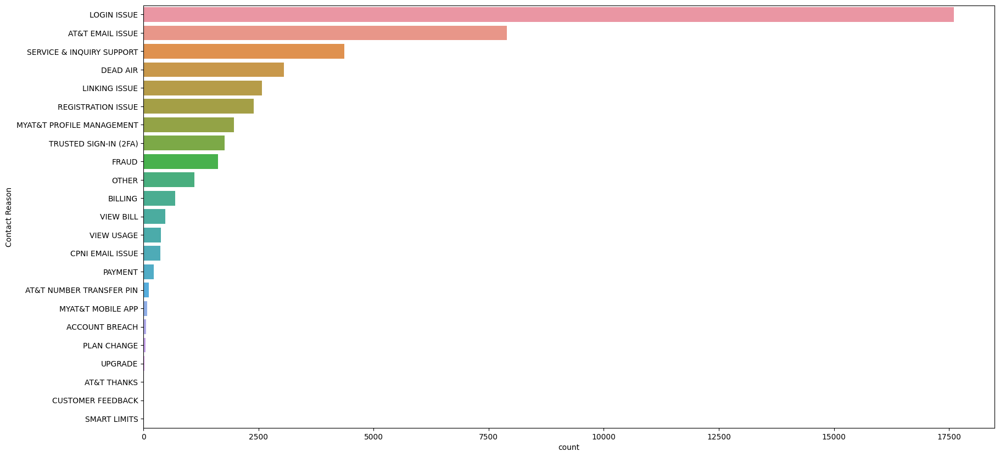

In [62]:
sns.countplot(y = "Contact Reason", data = df,order = df["Contact Reason"].value_counts().index)
plt.show()

In [63]:
fig = px.pie(df, names = 'Contact Reason',color_discrete_sequence=px.colors.sequential.Inferno, 
             title = 'Contact Reason')
fig.show()

In [64]:
df["Contact Reason"].value_counts()

LOGIN ISSUE                  17609
AT&T EMAIL ISSUE              7901
SERVICE & INQUIRY SUPPORT     4362
DEAD AIR                      3050
LINKING ISSUE                 2576
REGISTRATION ISSUE            2400
MYAT&T PROFILE MANAGEMENT     1968
TRUSTED SIGN-IN (2FA)         1760
FRAUD                         1625
OTHER                         1111
BILLING                        695
VIEW BILL                      471
VIEW USAGE                     377
CPNI EMAIL ISSUE               368
PAYMENT                        222
AT&T NUMBER TRANSFER PIN       114
MYAT&T MOBILE APP               79
ACCOUNT BREACH                  55
PLAN CHANGE                     46
UPGRADE                         27
AT&T THANKS                     14
CUSTOMER FEEDBACK                5
SMART LIMITS                     2
Name: Contact Reason, dtype: int64

> Most of the times, callers asked for the login issues. I think there is some problem to login side as 38% of data shows the login issues and email issues on the second number. 

## Looking at the Contact Reason Details

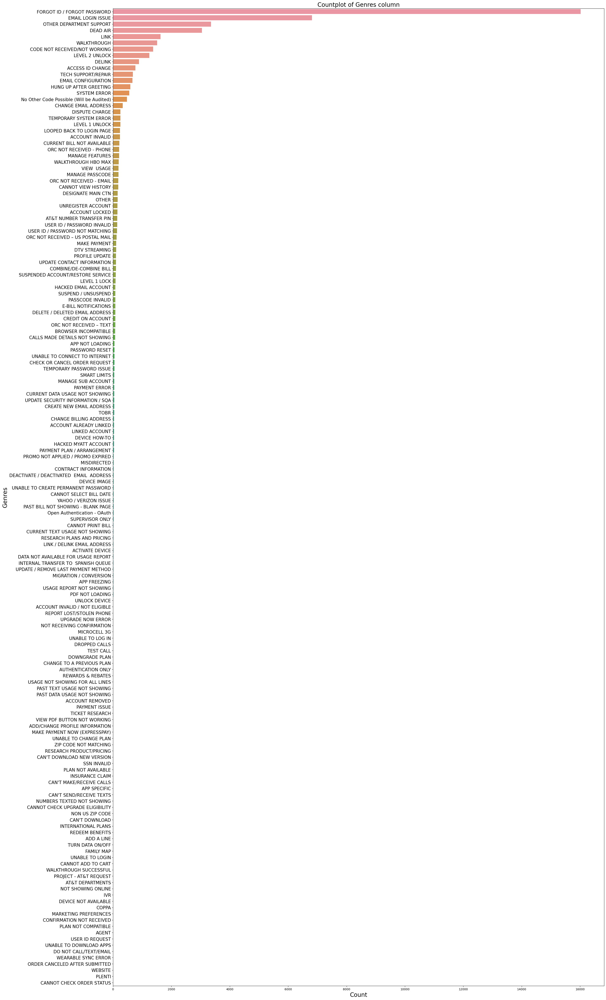

In [140]:
fig = plt.figure(figsize = [30, 60])
sns.countplot(y = "Contact Reason Detail", data = df, order = df["Contact Reason Detail"].value_counts().index)
plt.xticks(fontsize = 10)
plt.xlabel("Count", fontsize = 20)
plt.yticks(fontsize = 15);
plt.ylabel("Genres", fontsize = 20)
plt.title("Countplot of Genres column", fontsize = 20)
plt.show()

In [142]:
df["Contact Reason Detail"].value_counts()

FORGOT ID / FORGOT PASSWORD       16021
EMAIL LOGIN ISSUE                  6817
OTHER DEPARTMENT SUPPORT           3355
DEAD AIR                           3049
LINK                               1629
                                  ...  
WEARABLE SYNC ERROR                   1
ORDER CANCELED AFTER SUBMITTED        1
WEBSITE                               1
PLENTI                                1
CANNOT CHECK ORDER STATUS             1
Name: Contact Reason Detail, Length: 156, dtype: int64

> As we look at above most of the times, callers asked for the login issues. I think there is some problem to login side as 38% of data shows the login issues and email issues on the second number. 

> Login issues was from the forgot password. Callers solved their forgot password issues but there could be some proper way to change forgot password on the application

## Looking at the Caller Authenticated 

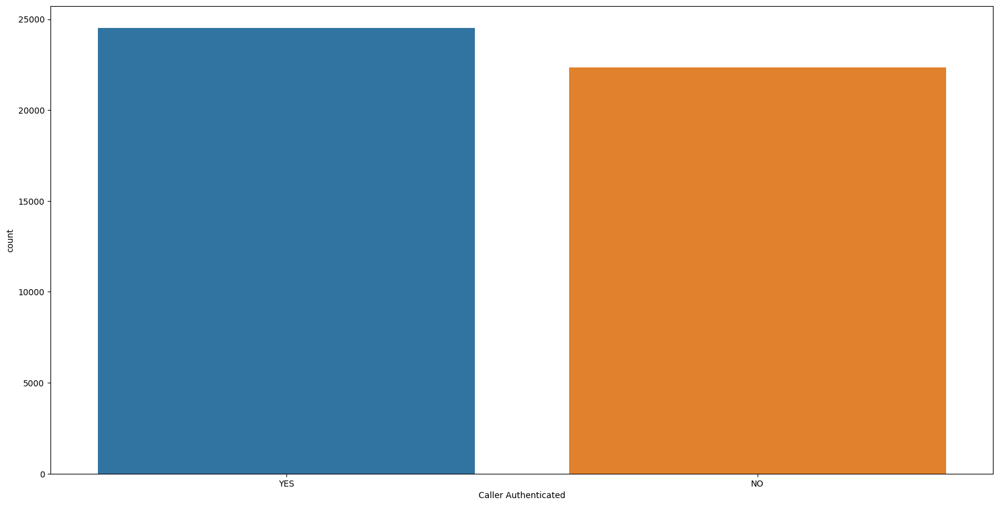

In [67]:
sns.countplot(data= df, x = "Caller Authenticated")
plt.show()

In [68]:
fig = px.pie(df, names = 'Caller Authenticated',color_discrete_sequence=px.colors.sequential.Inferno, 
             title = 'Caller Authenticated')
fig.show()

> Callers were authenticated most of the times with 52% but 47% was not authenticated. We will train some machine learning models to get predictions of authentication or not.

## Looking at the Type of device used for calling

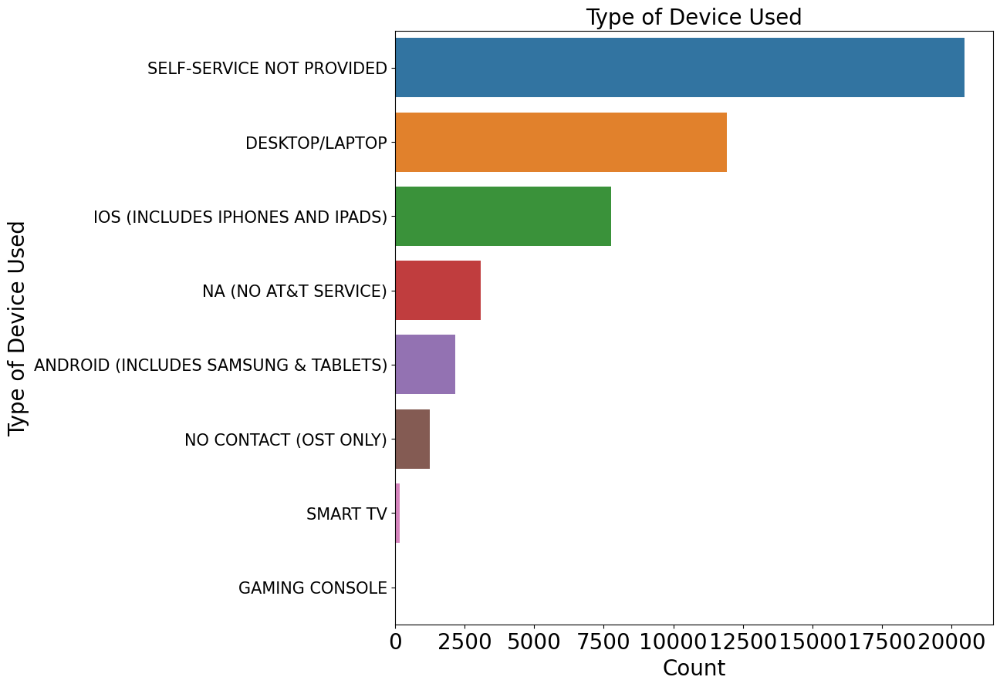

In [69]:
fig = plt.figure(figsize = [10, 10])
sns.countplot(y = "Type of Device Used", data = df, order = df["Type of Device Used"].value_counts().index)
plt.xticks(fontsize = 20)
plt.xlabel("Count", fontsize = 20)
plt.yticks(fontsize = 15);
plt.ylabel("Type of Device Used", fontsize = 20)
plt.title("Type of Device Used", fontsize = 20)
plt.show()

> laptop device used most of the time for the contact. Also IOS and android afterwards. 

## Looking at the MyATT APP Offered/Used

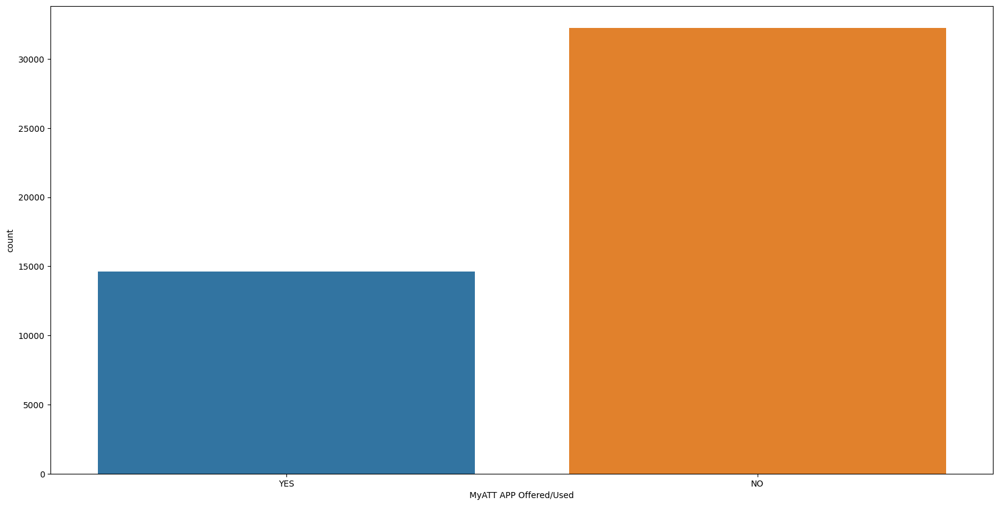

In [70]:
sns.countplot(data= df, x = "MyATT APP Offered/Used")
plt.show()

In [71]:
fig = px.pie(df, names = 'MyATT APP Offered/Used', title = 'MyATT APP Offered/Used')
fig.show()

> MyATT APP offer used 68% and 32% not used which is the good ratio here to use the offer. 

## Converting the date columns into datetime format so we can get the day, years, hours and minutes. 

In [72]:
df['Call Start Date']=pd.to_datetime(df['Call Start Date'])
df['Call End Date']=pd.to_datetime(df['Call End Date'])

## Calculating the total call time by each caller ID in seconds 

In [73]:
df['Total Call time'] = (df['Call End Date']-df['Call Start Date']).dt.total_seconds()
df['Total Call time']

0        7505.0
1        4947.0
2        1065.0
3         277.0
4        2399.0
          ...  
47710     405.0
47711     368.0
47712      37.0
47713      74.0
47714     170.0
Name: Total Call time, Length: 46837, dtype: float64

## Converting the seconds into minutes 

In [74]:
df['Total Call time']=df['Total Call time'] /60
df['Total Call time']=df['Total Call time'].astype(int)
df['Total Call time']

0        125
1         82
2         17
3          4
4         39
        ... 
47710      6
47711      6
47712      0
47713      1
47714      2
Name: Total Call time, Length: 46837, dtype: int32

## There is a line chart which shows the call time by each caller over the time

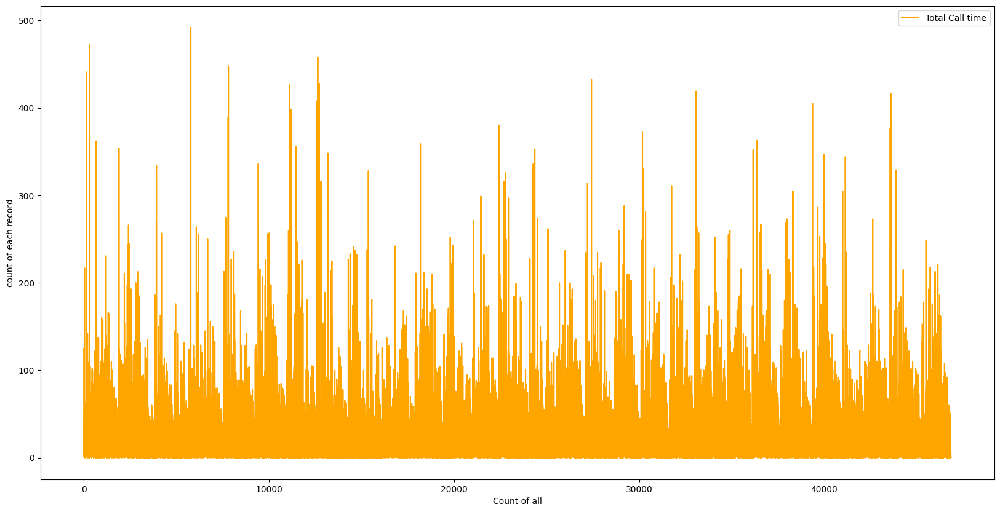

In [75]:
plt.figure(figsize=(20, 10))
plt.plot(df['Total Call time'].values,color='orange',label='Total Call time')
plt.xlabel('Count of all')
plt.ylabel('count of each record')
plt.legend(loc='best')
plt.show()

> Most of the time, calls were in the range 60 minutes but some calls gone in hours. But in average the calls are in the hour.  

## Total time of calls per month

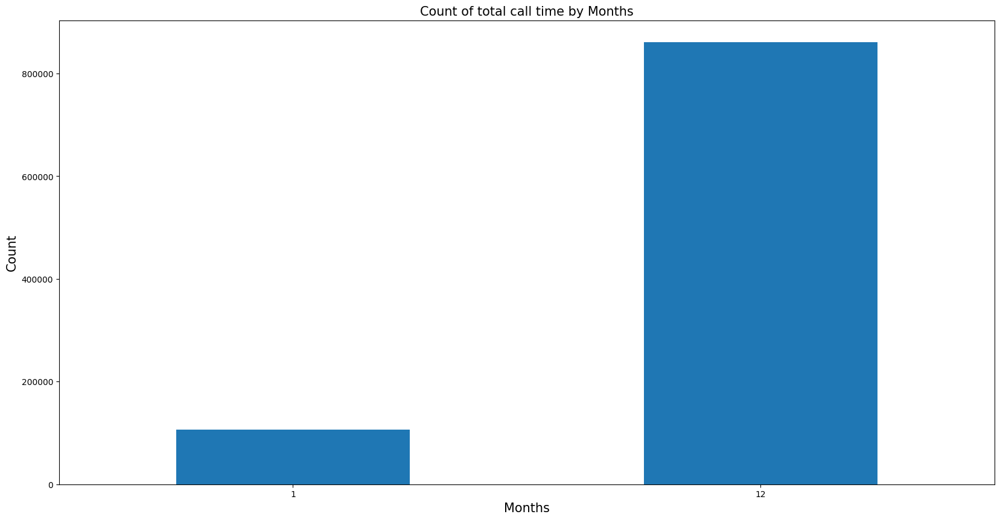

In [76]:
df['Created Date']=pd.to_datetime(df['Created Date'])
month = df['Created Date'].dt.month
df.groupby(month)["Total Call time"].sum().plot(kind = "bar")
plt.xticks(rotation = 0)
plt.xlabel("Months", fontsize = 15)
plt.ylabel("Count", fontsize = 15)
plt.title("Count of total call time by Months", fontsize = 15);

> In December, the calls time is too higher but in the first month is less.

## Total time of calls per year

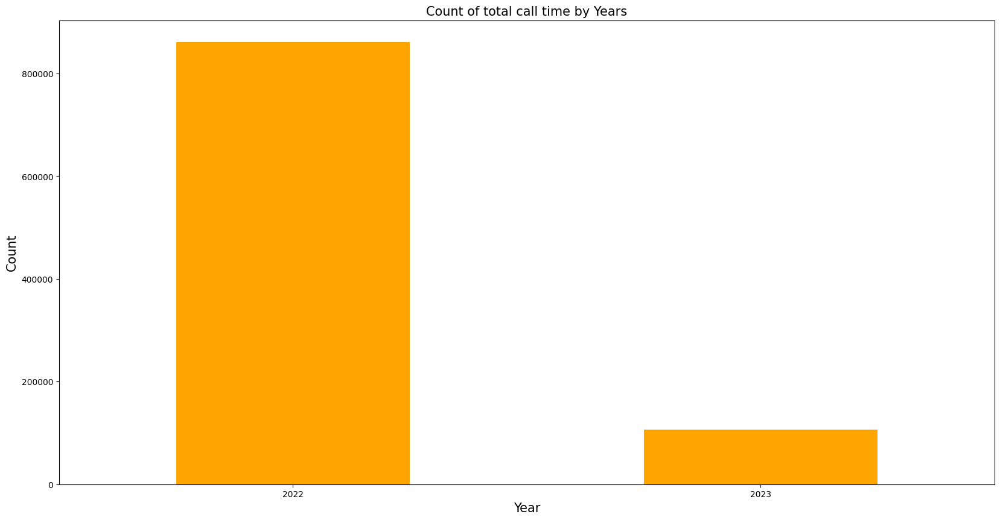

In [77]:
year = df['Created Date'].dt.year
df.groupby(year)["Total Call time"].sum().plot(kind = "bar",color='orange')
plt.xticks(rotation = 0)
plt.xlabel("Year", fontsize = 15)
plt.ylabel("Count", fontsize = 15)
plt.title("Count of total call time by Years", fontsize = 15);

> 2022 with the highest count but 2023 is less because there is only one month calls data of 2023.

## Total time of calls per day

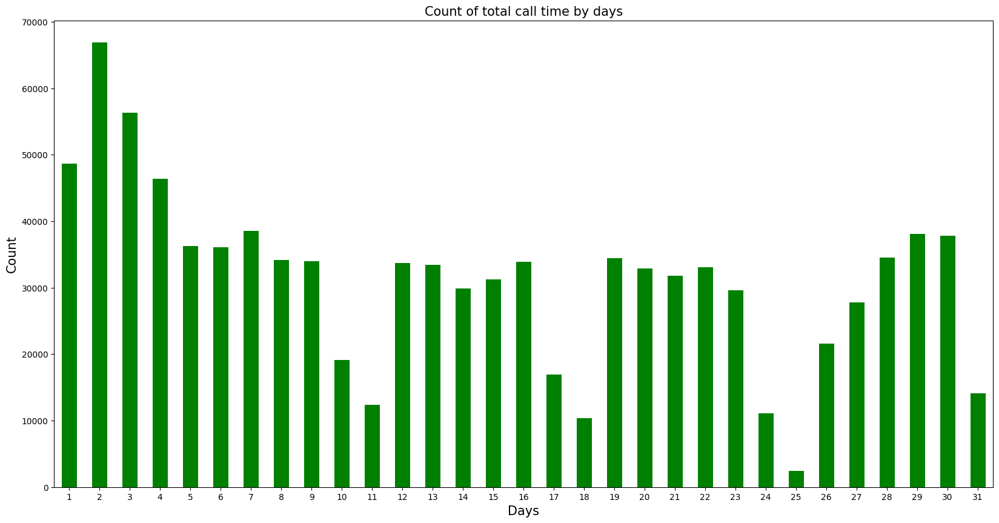

In [78]:
day = df['Created Date'].dt.day
df.groupby(day)["Total Call time"].sum().plot(kind = "bar",color='green')
plt.xticks(rotation = 0)
plt.xlabel("Days", fontsize = 15)
plt.ylabel("Count", fontsize = 15)
plt.title("Count of total call time by days", fontsize = 15);

> If we look at the days wise, the first week of every month is too busy with the calls. 

## Which products used most of the time with calls?

Text(0.5, 0, 'Product')

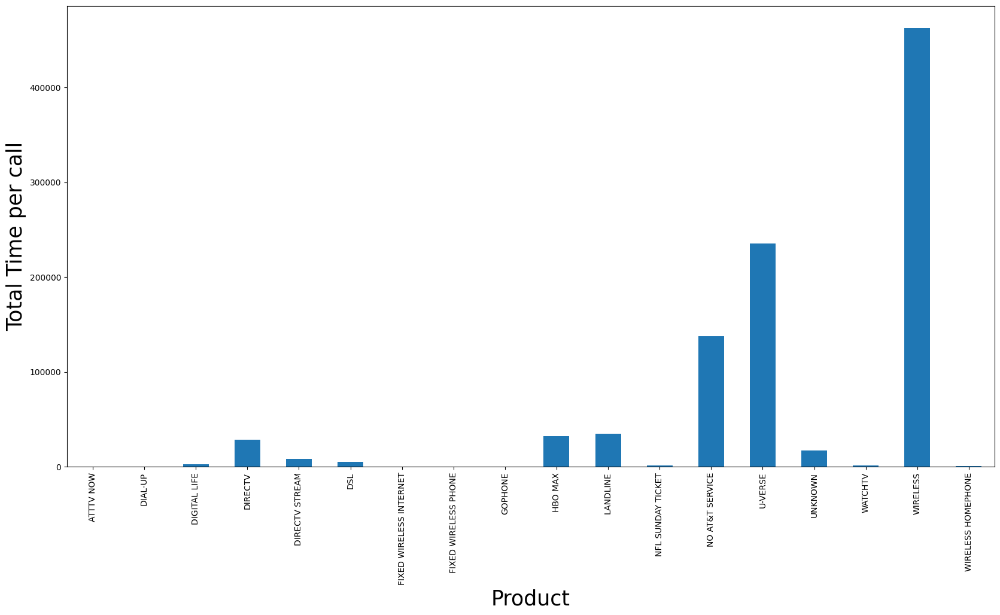

In [79]:
df.groupby("Product")["Total Call time"].sum().plot(kind = "bar")
plt.xticks(rotation = 90)
plt.ylabel("Total Time per call", fontsize = 25)
plt.xlabel("Product", fontsize = 25)

> Wireless products discussed most the time in calls. 

## How much callers authenticated most of the time with calls?

Text(0.5, 0, 'Caller Authenticated')

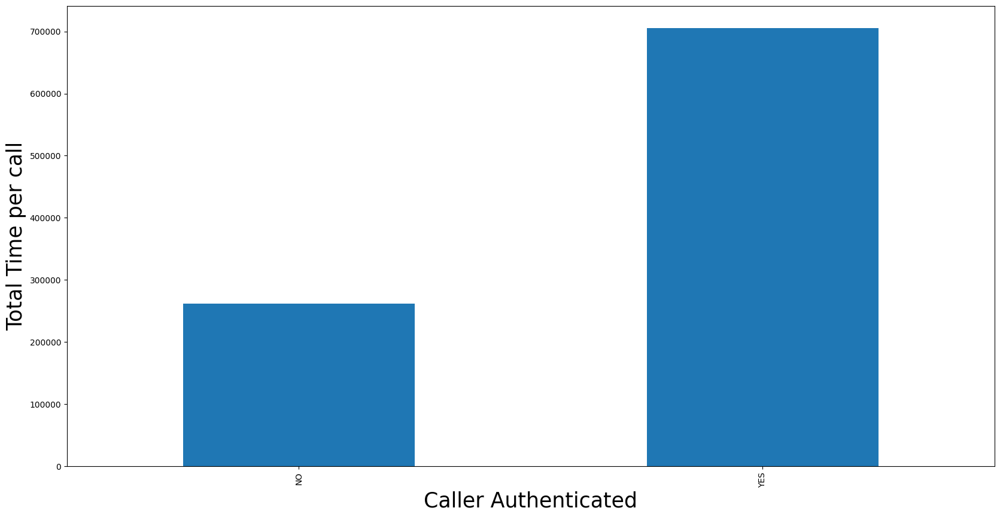

In [80]:
df.groupby("Caller Authenticated")["Total Call time"].sum().plot(kind = "bar")
plt.xticks(rotation = 90)
plt.ylabel("Total Time per call", fontsize = 25)
plt.xlabel("Caller Authenticated", fontsize = 25)

> Most of the time authenticated callers identified with a higher count in the data.

Text(0.5, 0, 'MyATT APP Offered/Used')

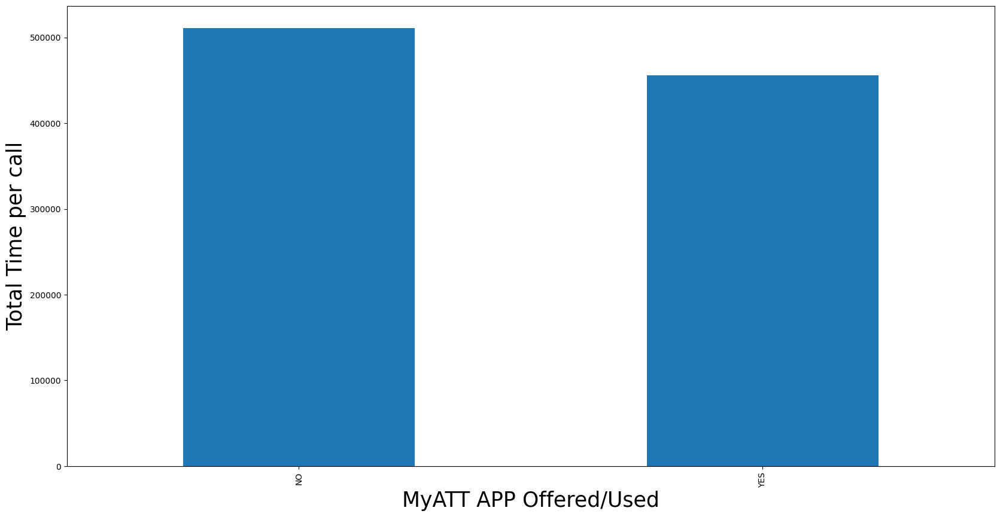

In [81]:
df.groupby("MyATT APP Offered/Used")["Total Call time"].sum().plot(kind = "bar")
plt.xticks(rotation = 90)
plt.ylabel("Total Time per call", fontsize = 25)
plt.xlabel("MyATT APP Offered/Used", fontsize = 25)

Text(0.5, 0, 'Self Service')

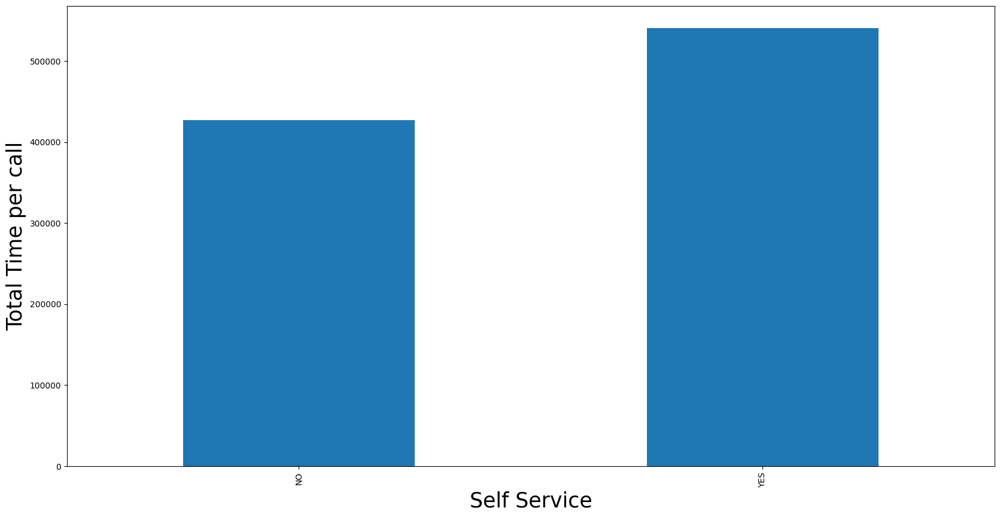

In [82]:
df.groupby("Self Service")["Total Call time"].sum().plot(kind = "bar")
plt.xticks(rotation = 90)
plt.ylabel("Total Time per call", fontsize = 25)
plt.xlabel("Self Service", fontsize = 25)

## Encoding the features from categorical data type to numric form for the features selection

In [83]:
df1=df.copy()
df1=df1.drop(columns=['Call Start Date','Call Duration','Call End Date', 'Created Date','Call Id',
                     'Agent ID','Action Taken','Callback Name','Customer Name'])
encoder={}
for col in df1.columns:
    df1[col]=df1[col].astype(str)
    encoder[col]=LabelEncoder()
    df1[col]=encoder[col].fit_transform(df1[col])

## Changing the Features types to decrease the memory usage

In [84]:
integer = []
floatt = []
cat=[]
for integerr in df1.columns[:-1]:
    if df1[integerr].dtype == "int64": integer.append(integerr)
    elif df1[integerr].dtype == "float64": floatt.append(integerr)
    elif df1[integerr].dtype == "object": cat.append(integerr)
    

df1[integer] = df1[integer].astype("int32")
df1[floatt] = df1[floatt].astype("float32")

## Correlation of Features

<AxesSubplot: title={'center': 'Pearson Correlation of Features'}>

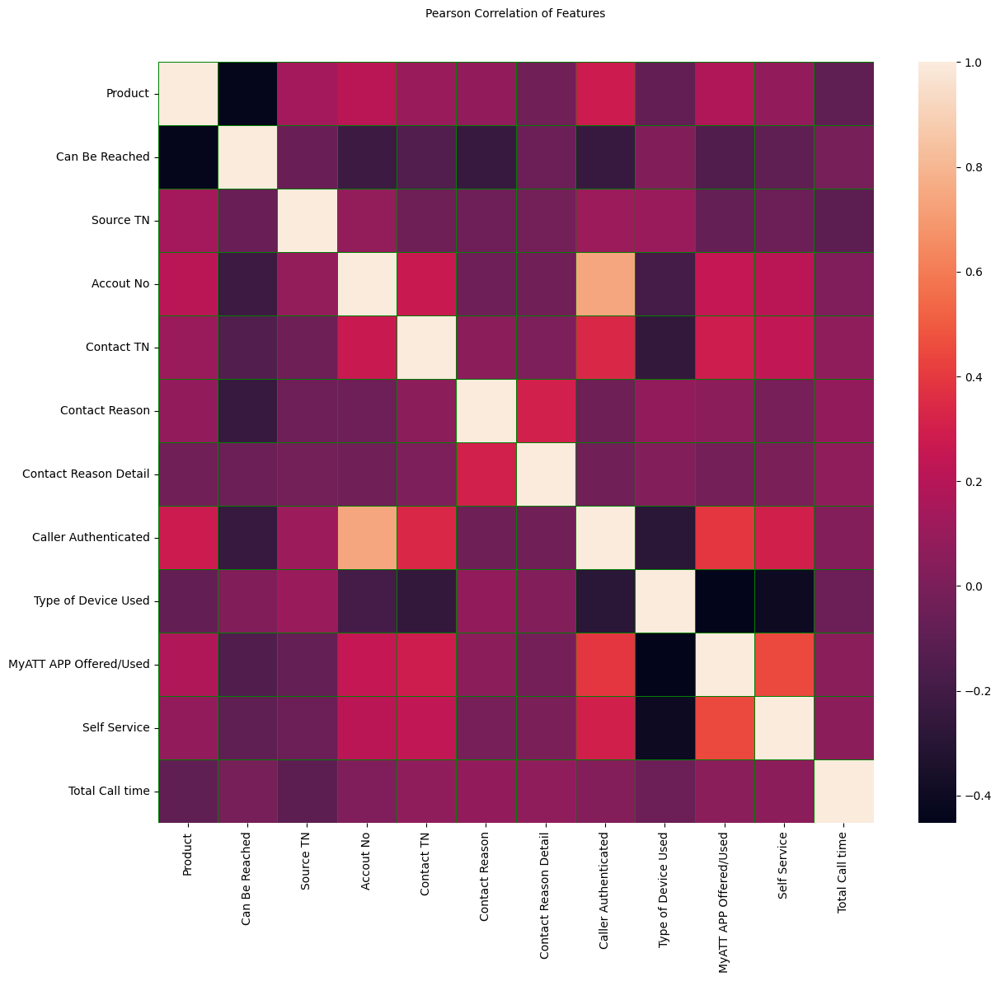

In [85]:
colormap = plt.cm.RdBu
plt.figure(figsize=(14,12))
plt.title('Pearson Correlation of Features', y=1.05, size=10)
sns.heatmap(df1.corr(),linewidths=0.5,vmax=1.0,linecolor='green')

> As we can see that the features are well correlated with each other. The dark color shows the weak correlation and brither one shows the strong correlation.

## Features importance 

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


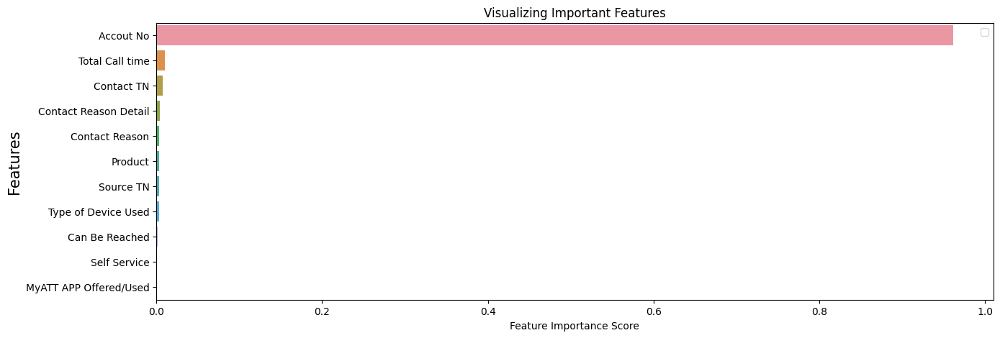

In [86]:
X=df1.drop(columns=['Caller Authenticated'])
y=df1['Caller Authenticated']

rf = DecisionTreeClassifier()
rf.fit(X, y)
feature_imp = pd.Series(rf.feature_importances_,index=X.columns).sort_values(ascending=False)
plt.figure(figsize=(15, 5))
sns.barplot(x=feature_imp, y=feature_imp.index)
plt.xlabel('Feature Importance Score')
plt.ylabel('Features',fontsize=15)
plt.title("Visualizing Important Features")
plt.legend()
plt.show()

In [87]:
feature_imp

Accout No                 0.961645
Total Call time           0.010091
Contact TN                0.007816
Contact Reason Detail     0.004395
Contact Reason            0.003448
Product                   0.003427
Source TN                 0.003023
Type of Device Used       0.002974
Can Be Reached            0.001175
Self Service              0.001058
MyATT APP Offered/Used    0.000948
dtype: float64

> All the features have some importance but there are some of the features which are not much important. Lets try features selection techniques to select best features. 

# Now going to separate the Input Features and Labels again as we need to apply features selection and features preparation techniques on input features. So
- Input_features = X
- Label= y

In [88]:
X=df1.drop(columns=['Caller Authenticated'])
y=df1['Caller Authenticated']

In [89]:
print('Shape of the input features:  ', X.shape[1])

Shape of the input features:   11


<div class="alert alert-block alert-info">  
<h1><center><strong>Feature Selection Techniques and Methods</strong></center></h1>
        
</div>

### Univariate feature selection
- using mutual_info_classif technique to extrcat the most useful features from the data

In [90]:
MiC_M= SelectKBest(mutual_info_classif, k=8)
MiC_M.fit(X, y)
MiC_features = MiC_M.transform(X)

In [91]:
feature_names = list(X.columns[MiC_M.get_support(indices=True)])
MiC_features=pd.DataFrame(MiC_features)
MiC_features.columns=feature_names
MiC_features.head()

,Product,Can Be Reached,Accout No,Contact TN,Contact Reason Detail,Type of Device Used,MyATT APP Offered/Used,Self Service
0,13,3,1145,5204,0,1,1,1
1,13,4,10901,18914,60,3,1,1
2,12,2,0,13981,68,1,0,0
3,12,3,20817,3,58,6,0,1
4,12,3,15424,5913,58,6,1,1


In [92]:
#These features are selected
list(MiC_features.columns)

['Product',
 'Can Be Reached',
 'Accout No',
 'Contact TN',
 'Contact Reason Detail',
 'Type of Device Used',
 'MyATT APP Offered/Used',
 'Self Service']

In [93]:
# K=20 so we selected the most useful features 
MiC_features=pd.DataFrame(MiC_features)
MiC_features.shape[1]  #Features count

8

### Univariate feature selection
- using f_classif technique to extrcat the most useful features from the data

In [94]:
FCF_M= SelectKBest(f_classif, k=8)
FCF_M.fit(X, y)
FCF_features = FCF_M.transform(X)

In [95]:
feature_names = list(X.columns[FCF_M.get_support(indices=True)])
FCF_features=pd.DataFrame(FCF_features)
FCF_features.columns=feature_names
FCF_features.head()

,Product,Can Be Reached,Source TN,Accout No,Contact TN,Type of Device Used,MyATT APP Offered/Used,Self Service
0,13,3,39,1145,5204,1,1,1
1,13,4,28,10901,18914,3,1,1
2,12,2,11,0,13981,1,0,0
3,12,3,34,20817,3,6,0,1
4,12,3,23,15424,5913,6,1,1


In [96]:
#These features are selected
list(FCF_features.columns)

['Product',
 'Can Be Reached',
 'Source TN',
 'Accout No',
 'Contact TN',
 'Type of Device Used',
 'MyATT APP Offered/Used',
 'Self Service']

In [97]:
#K=20 so we selected the most useful features 
FCF_features=pd.DataFrame(FCF_features)
FCF_features.shape[1]  #Features count

8

### Univariate feature selection
- using chi2 technique to extrcat the most useful features from the data

In [98]:
C_M= SelectKBest(chi2, k=8)
C_M.fit(X, y)
C_features = C_M.transform(X)

In [99]:
feature_names = list(X.columns[C_M.get_support(indices=True)])
C_features=pd.DataFrame(C_features)
C_features.columns=feature_names
C_features.head()

,Product,Source TN,Accout No,Contact TN,Type of Device Used,MyATT APP Offered/Used,Self Service,Total Call time
0,13,39,1145,5204,1,1,1,30
1,13,28,10901,18914,3,1,1,284
2,12,11,0,13981,1,0,0,79
3,12,34,20817,3,6,0,1,225
4,12,23,15424,5913,6,1,1,223


In [100]:
#These features are selected
list(C_features.columns)

['Product',
 'Source TN',
 'Accout No',
 'Contact TN',
 'Type of Device Used',
 'MyATT APP Offered/Used',
 'Self Service',
 'Total Call time']

In [101]:
#K=20 so we selected the most useful features 
C_features=pd.DataFrame(C_features)
C_features.shape[1]  #Features count

8

### Feature selection using SelectFromModel
- L1-based feature selection

In [102]:
#by using the SVM L1 based features, we selected most useful features 
L_svc = LinearSVC(C=0.01, penalty="l1", dual=False).fit(X, y)
L_svc = SelectFromModel(L_svc, prefit=True)
L_svc_Features = L_svc.transform(X)

In [103]:
feature_names = list(X.columns[L_svc.get_support(indices=True)])
L_svc_Features=pd.DataFrame(L_svc_Features)
L_svc_Features.columns=feature_names
L_svc_Features.head()

,Product,Can Be Reached,Source TN,Accout No,Contact TN,Contact Reason,Contact Reason Detail,Type of Device Used,MyATT APP Offered/Used,Self Service,Total Call time
0,13,3,39,1145,5204,12,0,1,1,1,30
1,13,4,28,10901,18914,10,60,3,1,1,284
2,12,2,11,0,13981,8,68,1,0,0,79
3,12,3,34,20817,3,1,58,6,0,1,225
4,12,3,23,15424,5913,1,58,6,1,1,223


In [104]:
#These features are selected
list(L_svc_Features.columns)

['Product',
 'Can Be Reached',
 'Source TN',
 'Accout No',
 'Contact TN',
 'Contact Reason',
 'Contact Reason Detail',
 'Type of Device Used',
 'MyATT APP Offered/Used',
 'Self Service',
 'Total Call time']

In [105]:
L_svc_Features.shape[1]  #Features count

11

### Feature selection using SelectFromModel
- Tree-based feature selection

In [106]:
ETC_M = ExtraTreesClassifier(n_estimators=40)
ETC_M.fit(X, y)
ETC_M = SelectFromModel(ETC_M, prefit=True)
ETC_M_Features = ETC_M.transform(X)

In [107]:
feature_names = list(X.columns[ETC_M.get_support(indices=True)])
ETC_M_Features=pd.DataFrame(ETC_M_Features)
ETC_M_Features.columns=feature_names
ETC_M_Features.head()

,Accout No
0,1145
1,10901
2,0
3,20817
4,15424


In [108]:
#These features are selected
list(ETC_M_Features.columns)

['Accout No']

In [109]:
ETC_M_Features.shape[1]  #Features count

1

- We are going to combine all the features that are selected using differenet techniques 

In [110]:
Hybrid_Features=pd.concat([MiC_features, FCF_features, C_features, L_svc_Features, ETC_M_Features], axis=1)
#drop all those features 
Hybrid_Features = Hybrid_Features.loc[:,~Hybrid_Features.columns.duplicated()]

In [111]:
Hybrid_Features.shape[1]  #Features count

11

In [112]:
list(Hybrid_Features.columns)

['Product',
 'Can Be Reached',
 'Accout No',
 'Contact TN',
 'Contact Reason Detail',
 'Type of Device Used',
 'MyATT APP Offered/Used',
 'Self Service',
 'Source TN',
 'Total Call time',
 'Contact Reason']

> After doing all the analysis of the data, now we are going to apply machine learning modelling that which callers are authenticated and which are not.

# Spliting Dataset into 70% Training and 30% Testing

In [113]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, random_state=100)

# -------------------------------------------------------------------------------------------------------------

# Random Forest

In [114]:
Ran_For= RandomForestClassifier(n_estimators=100,max_depth=15, random_state=11,max_leaf_nodes=10)
Ran_For= Ran_For.fit(X_train , y_train)
Ran_For

RandomForestClassifier(max_depth=15, max_leaf_nodes=10, random_state=11)

In [115]:
y_pred1 = Ran_For.predict(X_test)
rn=Ran_For.score(X_test, y_test)
print('Accuracy score= {:.2f}'.format(Ran_For.score(X_test, y_test)))

Accuracy score= 0.99


# Confusion Matrix



confusion matrix


[[6498  187]
 [   0 7367]]




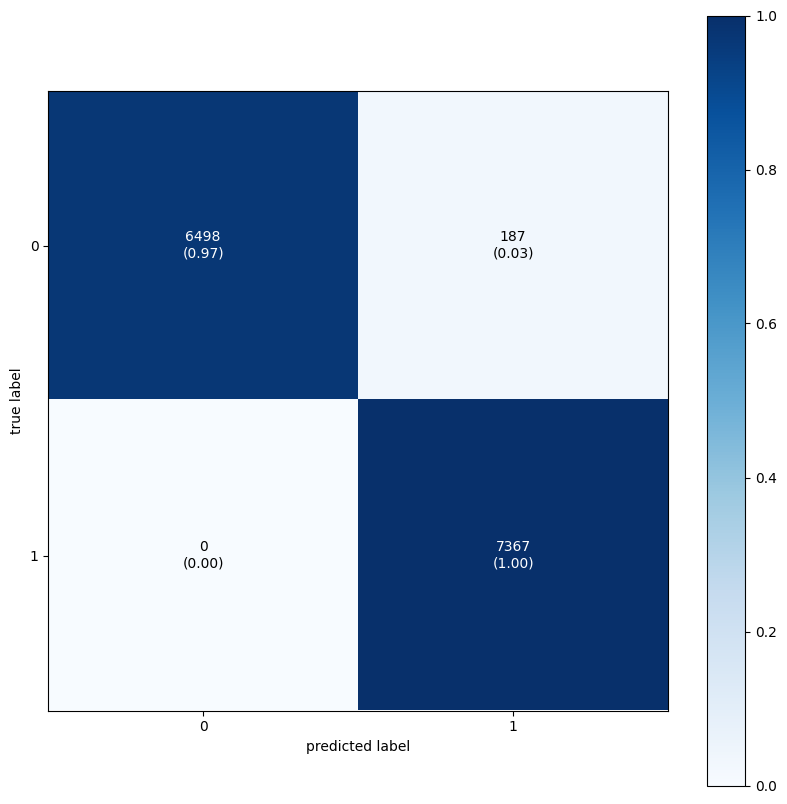

In [116]:
print('\n')
print("confusion matrix")
print('\n')
CR=confusion_matrix(y_test, y_pred1)
print(CR)
print('\n')

fig, ax = plot_confusion_matrix(conf_mat=CR,figsize=(10, 10),
                                show_absolute=True,
                                show_normed=True,
                                colorbar=True)
plt.show()

# Precision, Recall, F1

In [117]:
print('\n')
print("Precision, Recall, F1")
print('\n')
CR=classification_report(y_test, y_pred1)
print(CR)
print('\n')



Precision, Recall, F1


              precision    recall  f1-score   support

           0       1.00      0.97      0.99      6685
           1       0.98      1.00      0.99      7367

    accuracy                           0.99     14052
   macro avg       0.99      0.99      0.99     14052
weighted avg       0.99      0.99      0.99     14052





# ROC CURVE

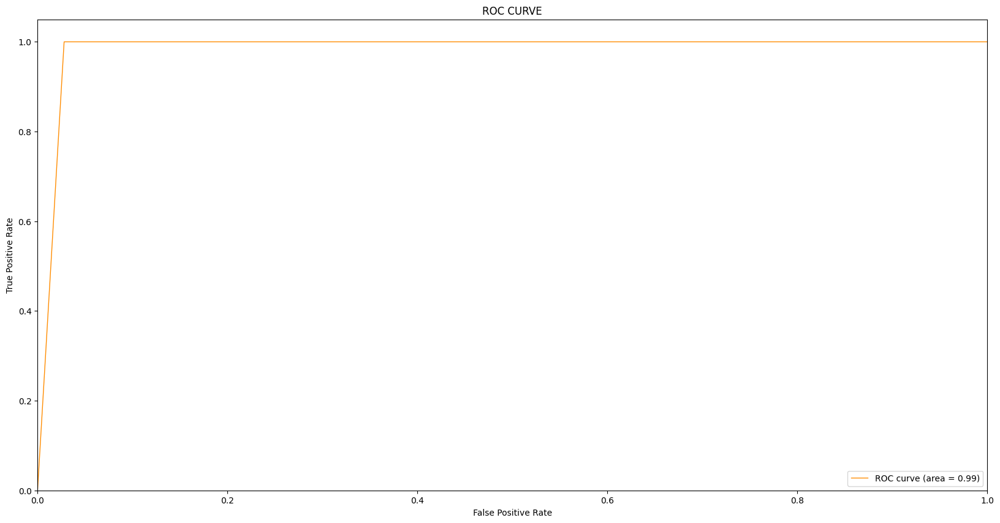

In [118]:
fpr2, tpr2, thresholds = roc_curve(y_test, y_pred1)
roc_auc = auc(fpr2, tpr2)
plt.figure()
plt.plot(fpr2, tpr2, color='darkorange', lw=1, label='ROC curve (area = %0.2f)' % roc_auc)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC CURVE')
plt.legend(loc="lower right")
plt.show()

# -------------------------------------------------------------------------------------------------------------

# SVM Support Vector Machine

In [119]:
svc=LinearSVC(random_state=0, tol=1e-5)
svc= svc.fit(X_train , y_train)
svc

LinearSVC(random_state=0, tol=1e-05)

In [120]:
y_pred1 = svc.predict(X_test)
sv=svc.score(X_test, y_test)
print('Accuracy score= {:.2f}'.format(svc.score(X_test, y_test)))

Accuracy score= 0.85


# Confusion Matrix



confusion matrix


[[4618 2067]
 [  40 7327]]




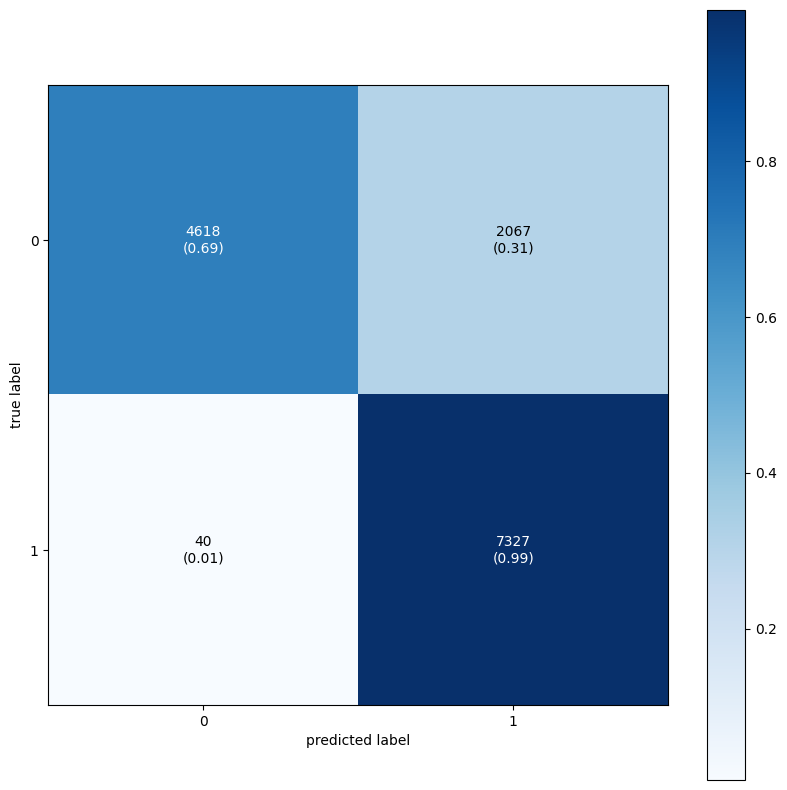

In [121]:
print('\n')
print("confusion matrix")
print('\n')
CR=confusion_matrix(y_test, y_pred1)
print(CR)
print('\n')

fig, ax = plot_confusion_matrix(conf_mat=CR,figsize=(10, 10),
                                show_absolute=True,
                                show_normed=True,
                                colorbar=True)
plt.show()

# Precision, Recall, F1

In [122]:
print('\n')
print("Precision, Recall, F1")
print('\n')
CR=classification_report(y_test, y_pred1)
print(CR)
print('\n')



Precision, Recall, F1


              precision    recall  f1-score   support

           0       0.99      0.69      0.81      6685
           1       0.78      0.99      0.87      7367

    accuracy                           0.85     14052
   macro avg       0.89      0.84      0.84     14052
weighted avg       0.88      0.85      0.85     14052





# ROC CURVE

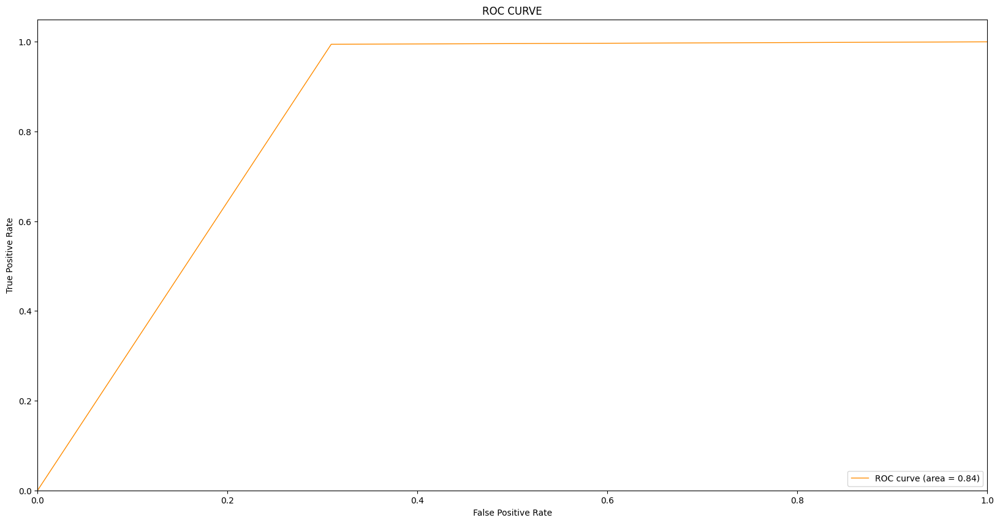

In [123]:
fpr3, tpr3, thresholds = roc_curve(y_test, y_pred1)
roc_auc = auc(fpr3, tpr3)
plt.figure()
plt.plot(fpr3, tpr3, color='darkorange', lw=1, label='ROC curve (area = %0.2f)' % roc_auc)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC CURVE')
plt.legend(loc="lower right")
plt.show()

# -------------------------------------------------------------------------------------------------------------

# Logistic Regression

In [124]:
LR= LogisticRegression(random_state=99, solver='lbfgs', multi_class='multinomial')
LR= LR.fit(X_train , y_train)
LR

LogisticRegression(multi_class='multinomial', random_state=99)

In [125]:
y_pred1 = LR.predict(X_test)
lr=LR.score(X_test, y_test)
print('Accuracy score= {:.2f}'.format(LR.score(X_test, y_test)))

Accuracy score= 0.94


# Confusion Matrix



confusion matrix


[[6492  193]
 [ 687 6680]]




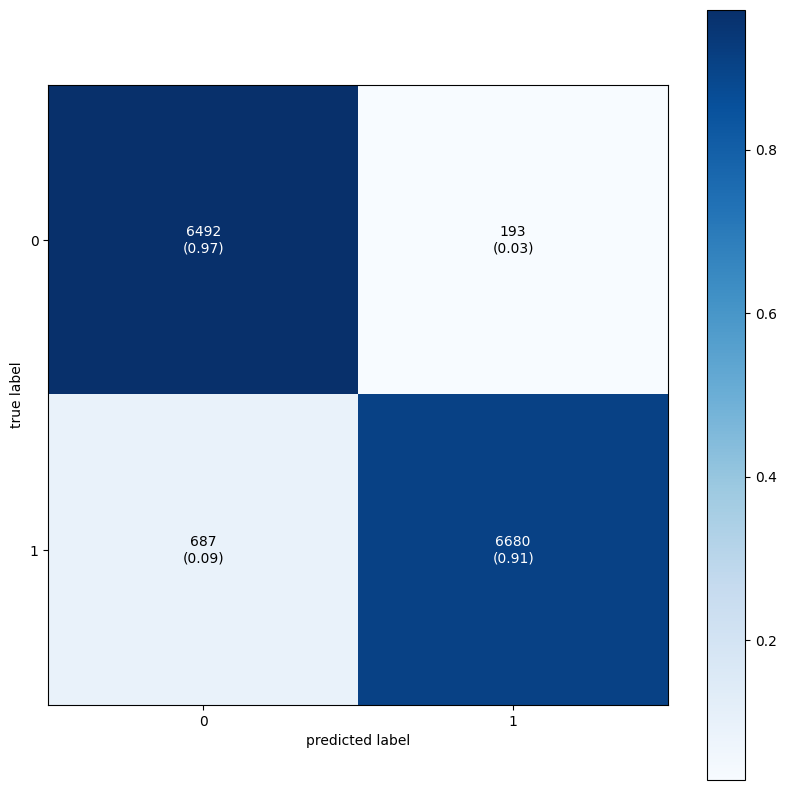

In [126]:
print('\n')
print("confusion matrix")
print('\n')
CR=confusion_matrix(y_test, y_pred1)
print(CR)
print('\n')

fig, ax = plot_confusion_matrix(conf_mat=CR,figsize=(10, 10),
                                show_absolute=True,
                                show_normed=True,
                                colorbar=True)
plt.show()

# Precision, Recall, F1

In [127]:
print('\n')
print("Precision, Recall, F1")
print('\n')
CR=classification_report(y_test, y_pred1)
print(CR)
print('\n')



Precision, Recall, F1


              precision    recall  f1-score   support

           0       0.90      0.97      0.94      6685
           1       0.97      0.91      0.94      7367

    accuracy                           0.94     14052
   macro avg       0.94      0.94      0.94     14052
weighted avg       0.94      0.94      0.94     14052





# ROC CURVE

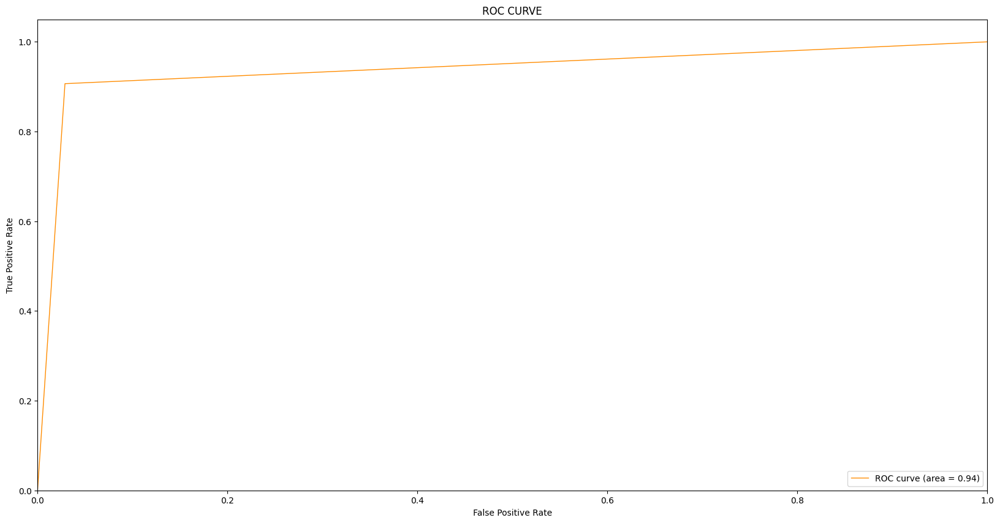

In [128]:
fpr4, tpr4, thresholds = roc_curve(y_test, y_pred1)
roc_auc = auc(fpr4, tpr4)
plt.figure()
plt.plot(fpr4, tpr4, color='darkorange', lw=1, label='ROC curve (area = %0.2f)' % roc_auc)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC CURVE')
plt.legend(loc="lower right")
plt.show()

# -------------------------------------------------------------------------------------------------------------

# KNN Algorithm

In [129]:
KNN=KNeighborsClassifier()
KNN= KNN.fit(X_train , y_train)
KNN

KNeighborsClassifier()

In [130]:
y_pred1 = KNN.predict(X_test)
kn=KNN.score(X_test, y_test)
print('Accuracy score= {:.2f}'.format(KNN.score(X_test, y_test)))

Accuracy score= 0.98


# Confusion Matrix



confusion matrix


[[6499  186]
 [  47 7320]]




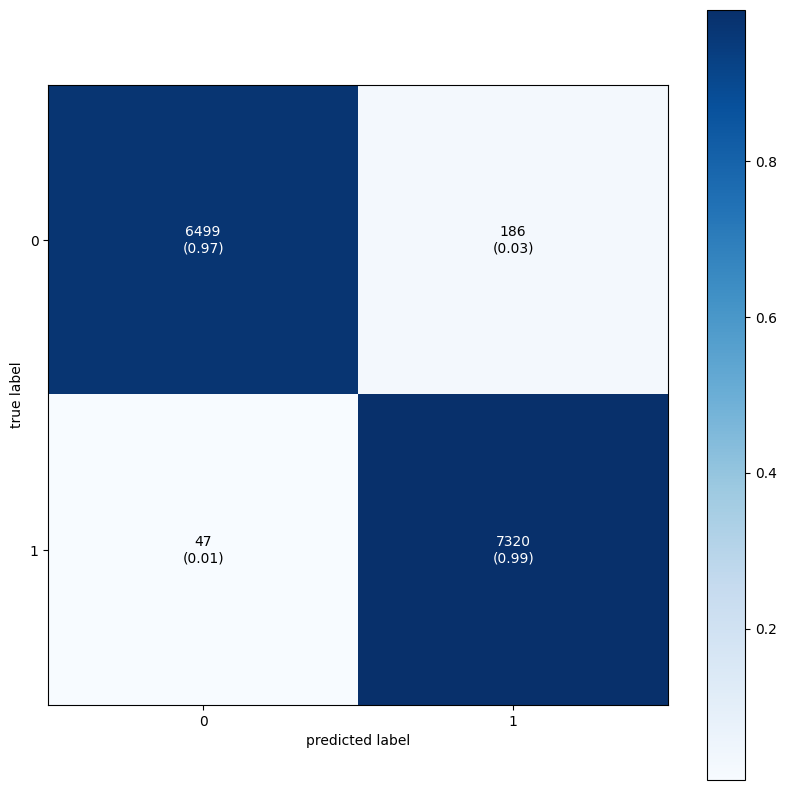

In [131]:
print('\n')
print("confusion matrix")
print('\n')
CR=confusion_matrix(y_test, y_pred1)
print(CR)
print('\n')

fig, ax = plot_confusion_matrix(conf_mat=CR,figsize=(10, 10),
                                show_absolute=True,
                                show_normed=True,
                                colorbar=True)
plt.show()

# Precision, Recall, F1

In [132]:
print('\n')
print("Precision, Recall, F1")
print('\n')
CR=classification_report(y_test, y_pred1)
print(CR)
print('\n')



Precision, Recall, F1


              precision    recall  f1-score   support

           0       0.99      0.97      0.98      6685
           1       0.98      0.99      0.98      7367

    accuracy                           0.98     14052
   macro avg       0.98      0.98      0.98     14052
weighted avg       0.98      0.98      0.98     14052





# ROC CURVE

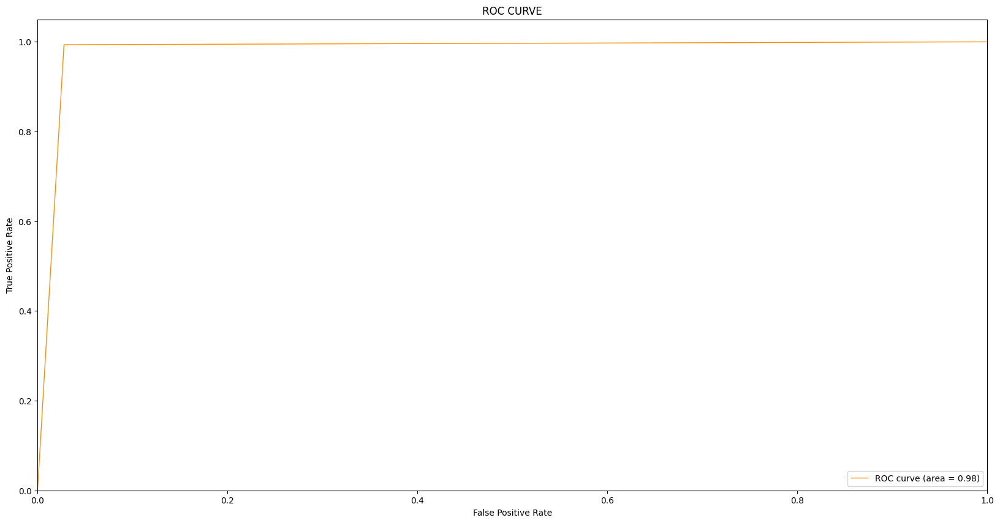

In [133]:
fpr5, tpr5, thresholds = roc_curve(y_test, y_pred1)
roc_auc = auc(fpr5, tpr5)
plt.figure()
plt.plot(fpr5, tpr5, color='darkorange', lw=1, label='ROC curve (area = %0.2f)' % roc_auc)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC CURVE')
plt.legend(loc="lower right")
plt.show()

# -------------------------------------------------------------------------------------------------------------

# -------------------------------------------------------------------------------------------------------------

# ROC Curve for Models

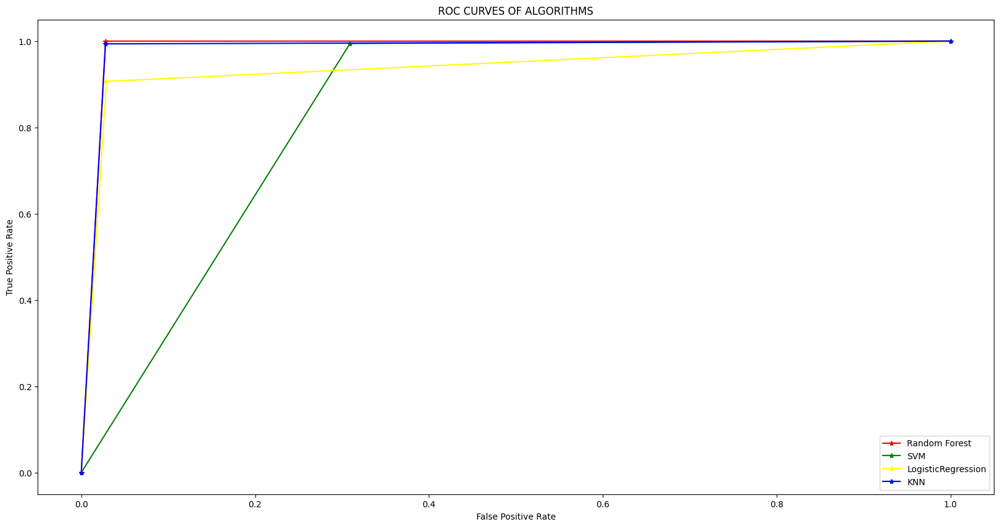

In [135]:
plt.plot(fpr2, tpr2, marker='*', label='Random Forest', color = 'Red')
plt.plot(fpr3, tpr3, marker='*', label='SVM', color = 'green')
plt.plot(fpr4, tpr4, marker='*', label='LogisticRegression', color = 'yellow')
plt.plot(fpr5, tpr5, marker='*', label='KNN', color = 'blue')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC CURVES OF ALGORITHMS')
plt.legend(loc="lower right")
plt.show()

# Comparison of all algorithms Results

In [136]:
x = PrettyTable()
print('\n')
print("Comparison of all algorithm results")
x.field_names = ["Model", "Accuracy"]


x.add_row(["Random Forest Algorithm", round(rn,2)])
x.add_row(["Support Vector Machine Algorithm", round(sv,2)])
x.add_row(["LogisticRegression Algorithm", round(lr,2)])
x.add_row(["KNN Algorithm", round(kn,2)])
print(x)
print('\n')



Comparison of all algorithm results
+----------------------------------+----------+
|              Model               | Accuracy |
+----------------------------------+----------+
|     Random Forest Algorithm      |   0.99   |
| Support Vector Machine Algorithm |   0.85   |
|   LogisticRegression Algorithm   |   0.94   |
|          KNN Algorithm           |   0.98   |
+----------------------------------+----------+




> Random Forest classifier is predicting well with 99% as Caller is Authenticated or not. 